<a href="https://colab.research.google.com/github/Matthew-Likhachev/linear-regression-OLS-practice-in-Uni/blob/main/OLS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Задание
1. Изучить пример, приведенный ниже.
2. Получить свой датасет у преподавателя.
3. Выбрать числовые признаки и таргет в датасете (признаки делаем числовыми или исключаем их).
2. Проанализировать результаты, полученные с помощью statsmodels.
3. Построить регрессионную зависимость (sklearn [тык](https://scikit-learn.ru/user_guide/)) с помощью метода наименьших квадратов, используя вычисление обратной матрицы.
4. Построить регрессионную зависимость (sklearn) с помощью метода наименьших квадратов, используя метод градиентного спуска.
4. Сравнить и описать результаты.

# Регрессионный анализ
[Wiki](https://ru.wikipedia.org/wiki/%D0%A0%D0%B5%D0%B3%D1%80%D0%B5%D1%81%D1%81%D0%B8%D0%BE%D0%BD%D0%BD%D1%8B%D0%B9_%D0%B0%D0%BD%D0%B0%D0%BB%D0%B8%D0%B7)


In [ ]:
import matplotlib.pyplot as plt
import random
import numpy as np
import pandas as pd
import scipy as sp
import seaborn as sns
import statsmodels.api as sm
import statsmodels.tsa.api as smt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
%matplotlib inline

Немного о pandas

[Документация](https://pandas.pydata.org/docs/user_guide/index.html#user-guide)

[Шпаргалка](https://smysl.io/blog/pandas/)

In [ ]:
df = pd.read_csv('/content/_energydata.csv')

In [ ]:
print ("Total number of rows in dataset = {}".format(df.shape[0]))
print ("Total number of columns in dataset = {}".format(df.shape[1]))

Total number of rows in dataset = 19735
Total number of columns in dataset = 29


In [ ]:
df['date'] = df['date'].str.replace("-","")
df['date'] = df['date'].str.replace(":","")
df['date'] = df['date'].str.replace(" ","")
df['date'] = df['date'].astype(int)
df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,20160111170000,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,20160111171000,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,20160111172000,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,20160111173000,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,20160111174000,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 23 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        19735 non-null  int64  
 1   Appliances  19735 non-null  int64  
 2   lights      19735 non-null  int64  
 3   T1          19735 non-null  float64
 4   T2          19735 non-null  float64
 5   RH_2        19735 non-null  float64
 6   T3          19735 non-null  float64
 7   RH_3        19735 non-null  float64
 8   RH_4        19735 non-null  float64
 9   T5          19735 non-null  float64
 10  RH_5        19735 non-null  float64
 11  T6          19735 non-null  float64
 12  RH_6        19735 non-null  float64
 13  T7          19735 non-null  float64
 14  T8          19735 non-null  float64
 15  RH_8        19735 non-null  float64
 16  T9          19735 non-null  float64
 17  RH_9        19735 non-null  float64
 18  T_out       19735 non-null  float64
 19  RH_out      19735 non-nul

По df.info() видим, что пустых значений нет. RangeIndex: 200 и Non-Null Count у всех признаков = 200.


In [ ]:
target_col = "date"

In [ ]:
X = df.loc[:, df.columns != target_col]
y = df.loc[:, target_col]

In [ ]:
# Split the data into train and test with 70% data being used for training
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.30,
                                                    random_state=42)


# Линейная регрессия (statsmodels)



In [ ]:
X_with_constant = sm.add_constant(X_train)
model = sm.OLS(y_train, X_with_constant)

In [ ]:
results = model.fit()
results.params

const         2.015984e+13
Appliances   -1.961231e+04
lights       -7.100250e+04
T1           -1.020822e+07
T2           -1.116472e+06
RH_2          9.859138e+05
T3            1.093905e+07
RH_3         -5.001675e+06
RH_4         -4.397724e+06
T5            3.806260e+06
RH_5         -1.535989e+05
T6           -4.058564e+06
RH_6         -1.862911e+06
T7           -8.618201e+06
T8            1.359669e+06
RH_8          1.596065e+06
T9            3.211389e+07
RH_9         -2.927199e+06
T_out         1.933986e+07
RH_out        4.522558e+06
Windspeed    -2.620845e+06
Visibility   -1.015561e+05
Tdewpoint    -8.406521e+06
dtype: float64

In [ ]:
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                   date   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.930
Method:                 Least Squares   F-statistic:                     8300.
Date:                Fri, 04 Nov 2022   Prob (F-statistic):               0.00
Time:                        13:01:10   Log-Likelihood:            -2.5964e+05
No. Observations:               13814   AIC:                         5.193e+05
Df Residuals:                   13791   BIC:                         5.195e+05
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.016e+13    1.6e+07   1.26e+06      0.0

1. Коэффициенты регрессии модели Y = b0 + b1∙d1 + b2∙d2 + b3∙d3:



> Intercept = b0 = 2.7089

>b1 = 0.0441
>b2 = 0.1993
>b3 = 0.0069


2. Коэффициент детерминации R-squared = 0.906, его скорректированная оценка Adj. R-squared = 0.903 - это означает, что регрессионная модель объясняет 90% вариации переменной Y.


3. Проверка значимости коэффициента детерминации:

>расчетное значение статистики критерия Фишера: F-statistic = 434,5

>расчетный уровень значимости Prob (F-statistic) = 1.88e-69

>так как значение Prob (F-statistic) < 0.05, то нулевая гипотеза R-squared = 0 НЕ ПРИНИМАЕТСЯ, т.е. коэффициент детерминации ЗНАЧИМ

4. Проверка значимости коэффициентов регрессии:

>расчетный уровень значимости P>|t| для b0, b1, b2 не превышает 0.05 - это означает, что коэффициенты регрессии значимы

>об этом же свидетельствует то, что доверительный интервал для коэффициентов регрессии ([0.025; 0.975]) не включает в себя точку 0

>расчетный уровень значимости P>|t| для b3 превышает 0.05. Нулевая гипотеза не отвергается. b3 не является значимым.
Нулевая гипотеза - коэффициет равен нулю, альтернативная - не равен.

5. значение t для b3 очень мало (чем выше значение t, тем выше шанс, что мы отвергаем нулевую гипотезу).

Также в таблице результатов содержится прочая информация по коэффициентам регрессии: стандартная ошибка Std.Err.

# Ваше задание
Удаляем признаки, которые не являются значимыми, и повторяем обучение без них.

In [ ]:
# тут будет код
del df['RH_1']
del df['T4']
del df['RH_7']
del df['Press_mm_hg']
del df['rv1']
del df['rv2']

In [ ]:
X_test = sm.add_constant(X_test)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:142: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


In [ ]:
y_pred = results.predict(X_test)

In [ ]:
residual = y_test - y_pred

# Предпосылки линейной регрессии
Модель линейной регрессии можно построить не для любых данных, а только для данных, которые удовлетворяют ряду условий. И прежде, чем использовать регрессионное уравнение для прогнозирования, необходимо проверить выполнение этих условий. В ином случае наша модель не будет адекватна поставленной задаче, и ее использование будет бессмысленно.

# Наличие линейной зависимости
Первая и самая естественная предпосылка заключается в линейности модели. Под этим условием подразумевается корректность модели, выбор адекватных предикторов и отсутствие лишних предикторов. А также линейную зависимость целевой переменной от независимых переменных.

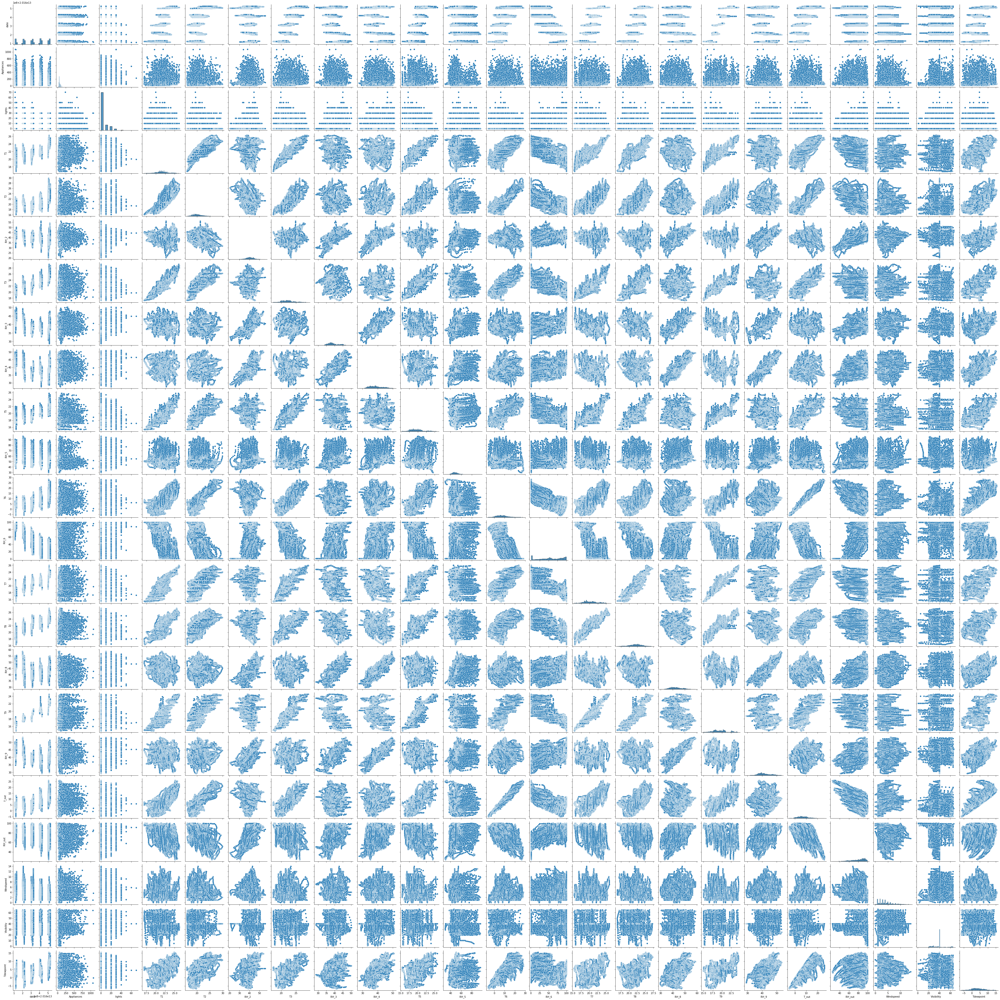

In [ ]:
sns.pairplot(df)

# Отсутствие мультиколлинеарности

Мультиколлинеарностью называют явление, которое заключается в наличии линейной зависимости между независимыми переменными (предикторами). Такое может возникать, например, при использовании признаков с естественной взаимосвязью: стаж работы и возраст (как правило, чем больше возраст - тем больше стаж и наоборот), количество детских садов и количество школ в районе (обычно детские сады бывают при школе, так что эти количества пропорционально взаимосвязаны) или баллы за экзамены IELTS и TOEFL (так как они экзамены проверяют примерно одни и те же знания и навыки)

Последствием мультиколлинеарности является расширение доверительных интервалов для коэффициентов, и модель получается очень неустойчивой и меняющейся от добавления даже 1-2 новых наблюдений. Разумеется, это не очень хорошая для нас ситуация, поэтому мы должны отбирать для модели только те предикторы, между которыми нет линейной связи.

Для того чтобы проверить данную предпосылку, нам необходимо построить матрицу корреляций для всех потенциальных предикторов, и отследить наличие сильной корреляционной связи. Нет четкой границы, которая отделяет допустимую взаимосвязь и недопустимую, но в ряде источников используется граница в районе 0.9. То есть, если между предикторами коэффициент корреляции по модулю больше, чем 0.9, то мы не можем оба этих предиктора использовать для модели.

Почитать:

[wiki](https://ru.wikipedia.org/wiki/%D0%9C%D1%83%D0%BB%D1%8C%D1%82%D0%B8%D0%BA%D0%BE%D0%BB%D0%BB%D0%B8%D0%BD%D0%B5%D0%B0%D1%80%D0%BD%D0%BE%D1%81%D1%82%D1%8C#:~:text=%D0%9C%D1%83%D0%BB%D1%8C%D1%82%D0%B8%D0%BA%D0%BE%D0%BB%D0%BB%D0%B8%D0%BD%D0%B5%D0%B0%D1%80%D0%BD%D0%BE%D1%81%D1%82%D1%8C%20(multicollinearity)%20%E2%80%94%20%D0%B2%20%D1%8D%D0%BA%D0%BE%D0%BD%D0%BE%D0%BC%D0%B5%D1%82%D1%80%D0%B8%D0%BA%D0%B5,%D0%BD%D0%B0%D0%BB%D0%B8%D1%87%D0%B8%D0%B5%20%D1%81%D0%B8%D0%BB%D1%8C%D0%BD%D0%BE%D0%B9%20%D0%BA%D0%BE%D1%80%D1%80%D0%B5%D0%BB%D1%8F%D1%86%D0%B8%D0%B8%20%D0%BC%D0%B5%D0%B6%D0%B4%D1%83%20%D1%84%D0%B0%D0%BA%D1%82%D0%BE%D1%80%D0%B0%D0%BC%D0%B8)

[статья](https://towardsdatascience.com/why-multicollinearity-isnt-an-issue-in-machine-learning-5c9aa2f1a83a)


In [ ]:
cols_num = ['Appliances', 'lights', 'T1', 'T2', 'RH_2', 'T3', 'RH_3', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'T8', 'RH_8', 'T9', 'RH_9', 'T_out', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint']

correlation = df.corr().loc[cols_num, cols_num]
correlation

,Appliances,lights,T1,T2,RH_2,T3,RH_3,RH_4,T5,RH_5,...,T7,T8,RH_8,T9,RH_9,T_out,RH_out,Windspeed,Visibility,Tdewpoint
Appliances,1.000000,0.197278,0.055447,0.120073,-0.060465,0.085060,0.036292,0.016965,0.019760,0.006955,...,0.025801,0.039572,-0.094039,0.010010,-0.051462,0.099155,-0.152282,0.087122,0.000230,0.015353
lights,0.197278,1.000000,-0.023528,-0.005622,0.050985,-0.097393,0.131161,0.114936,-0.078745,0.141233,...,-0.135347,-0.071458,0.012915,-0.157592,-0.008766,-0.074424,0.068543,0.060281,0.020038,-0.036322
T1,0.055447,-0.023528,1.000000,0.836834,-0.002509,0.892402,-0.028550,0.097861,0.885247,-0.014782,...,0.838705,0.825413,-0.006441,0.844777,0.071756,0.682846,-0.345481,-0.087654,-0.076210,0.571309
T2,0.120073,-0.005622,0.836834,1.000000,-0.165610,0.735245,0.121497,0.231563,0.720550,0.029595,...,0.663660,0.578191,0.068534,0.675535,0.157346,0.792255,-0.505291,0.052495,-0.069721,0.582602
RH_2,-0.060465,0.050985,-0.002509,-0.165610,1.000000,0.137319,0.678326,0.721435,0.110409,0.250271,...,-0.051422,-0.041023,0.679777,0.054544,0.676467,0.033674,0.584911,0.069190,-0.005368,0.499152
T3,0.085060,-0.097393,0.892402,0.735245,0.137319,1.000000,-0.011234,0.122737,0.888169,-0.066355,...,0.847374,0.795283,0.044427,0.901324,0.134602,0.699417,-0.281718,-0.100776,-0.102310,0.645886
RH_3,0.036292,0.131161,-0.028550,0.121497,0.678326,-0.011234,1.000000,0.898978,-0.050062,0.375422,...,-0.250090,-0.283228,0.828822,-0.195270,0.833538,0.118207,0.356192,0.263188,0.017041,0.414387
RH_4,0.016965,0.114936,0.097861,0.231563,0.721435,0.122737,0.898978,1.000000,0.091812,0.352591,...,-0.131204,-0.167066,0.847259,-0.044518,0.856591,0.293289,0.336813,0.300192,0.002636,0.616509
T5,0.019760,-0.078745,0.885247,0.720550,0.110409,0.888169,-0.050062,0.091812,1.000000,0.032786,...,0.870624,0.824981,0.016388,0.911055,0.072308,0.651321,-0.273953,-0.145011,-0.084164,0.588362
RH_5,0.006955,0.141233,-0.014782,0.029595,0.250271,-0.066355,0.375422,0.352591,0.032786,1.000000,...,-0.142823,-0.086991,0.359840,-0.138509,0.272197,-0.053126,0.185941,0.082044,-0.013133,0.078175


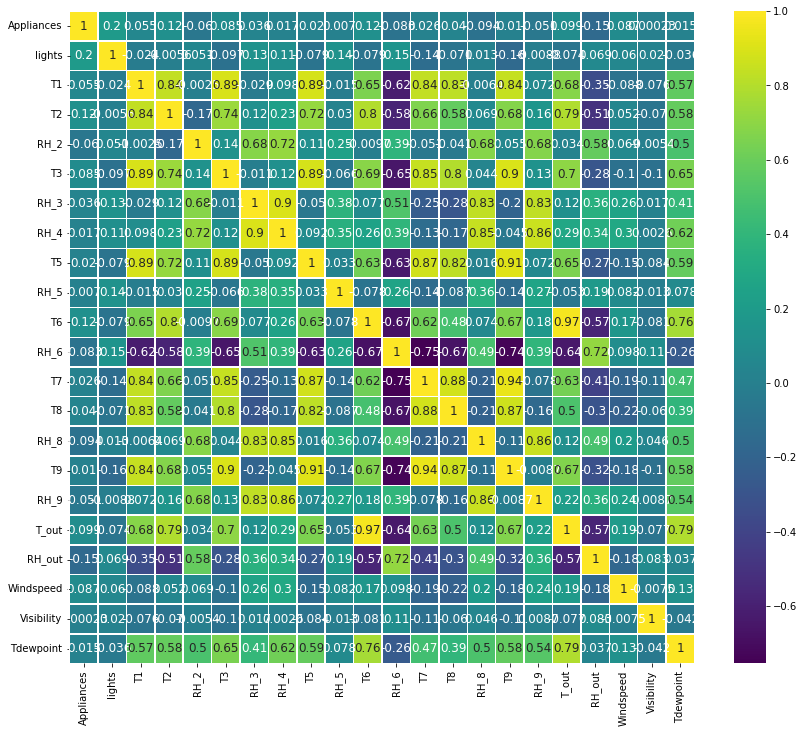

In [ ]:

fig , ax = plt.subplots(figsize = (14,12))

sns.heatmap(correlation,
            linewidths=0.5, annot=True,cmap='viridis',
            linecolor="white", annot_kws = {'size':12})

In [ ]:
vif = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
pd.DataFrame({'vif': vif[0:]}, index=X_train.columns).T

,Appliances,lights,T1,T2,RH_2,T3,RH_3,RH_4,T5,RH_5,...,T7,T8,RH_8,T9,RH_9,T_out,RH_out,Windspeed,Visibility,Tdewpoint
vif,2.20858,1.461164,2753.75595,1537.52667,980.687797,1275.649395,1471.98633,1144.028911,1120.869992,44.893433,...,1315.105229,894.647168,452.324677,2371.62608,626.2314,218.730277,507.760176,5.051992,11.825989,36.907829


# Нормальное распределение ошибок
После того как мы построили модель регрессии, мы можем вычислить ошибки (остатки): разницы между реальным значением $y$ и предсказанным $\hat{y}$. Важным условием является нормальность распределения этих ошибок. То есть, распределение остатков должно стремиться к нормальному распределению. Проверить выполняемость этого условия можно визуально с помощью гистограммы или с помощью специальных статистических тестов.

В целом, такое условие связано не напрямую с остатками, а с тем, что зависимая переменная должна быть распределена нормально для любых значений х. Однако такое условие проверить довольно сложно, поэтому можно проверить такое условие с помощью анализа распределения остатков.

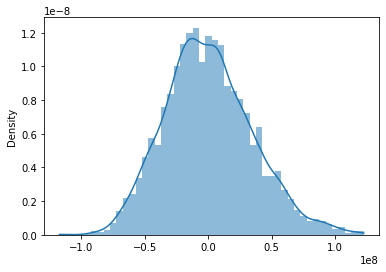

In [ ]:
sns.histplot(residual, kde=True, stat="density", linewidth=0)

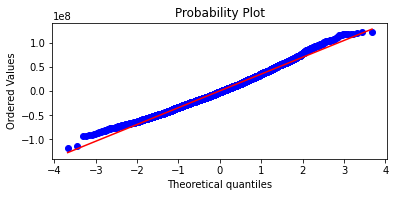

In [ ]:
fig, ax = plt.subplots(figsize=(6,2.5))
_, (__, ___, r) = sp.stats.probplot(residual, plot=ax, fit=True)

In [ ]:
np.mean(residual)

332136.46813513344

# Гомоскедантичность
Гомоскедастичность ошибок заключается в том, что разброс остатков при любых значениях независимых переменных одинаковый. Предположим, что мы хотим предсказать стоимость квартиры по каким-то ее признакам. Если для квартир площадью 30-50 метров разброс ошибок будет маленький, а для квартир, площадью 50-70 метров разброс ошибок будет очень большой, то мы будем иметь дело с гетероскедастичностью. Такая ситуация нас не устраивает. Нам важно, чтобы качество модели было одно и то же при любых значениях независимой переменной.

[wiki](https://ru.wikipedia.org/wiki/%D0%93%D0%BE%D0%BC%D0%BE%D1%81%D0%BA%D0%B5%D0%B4%D0%B0%D1%81%D1%82%D0%B8%D1%87%D0%BD%D0%BE%D1%81%D1%82%D1%8C)

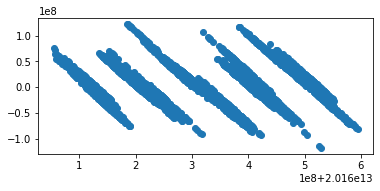

In [ ]:
fig, ax = plt.subplots(figsize=(6,2.5))
_ = ax.scatter(y_pred, residual)

# Отсутствие автокорреляции остатков
Автокорреляция остатков (ошибок) возникает в ситуации, когда есть линейная взаимосвязь между остатками для одних значений предикторов и остатками для других значений предикторов. Такое может проявляться в силу естественных причин, как и в случае сс мультиколлинеарностью. Например, если мы предсказываем какие-то показатели для соседних регионов страны, то, скорее всего, они будут сильно взаимосвязаны просто в силу схожести характеристик этих объектов.

Автокорреляция влечет за собой некорректные результаты. Стандартные ошибки получаются несостоятельными, и мы не можем строить корректные доверительные интервалы и проверять гипотезы классическими способами.

[wiki](https://ru.wikipedia.org/wiki/%D0%90%D0%B2%D1%82%D0%BE%D0%BA%D0%BE%D1%80%D1%80%D0%B5%D0%BB%D1%8F%D1%86%D0%B8%D0%BE%D0%BD%D0%BD%D0%B0%D1%8F_%D1%84%D1%83%D0%BD%D0%BA%D1%86%D0%B8%D1%8F)

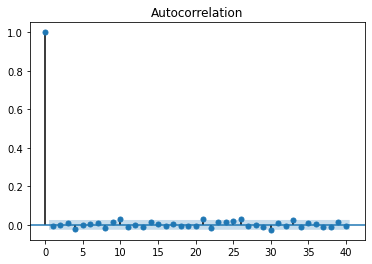

In [ ]:
acf = smt.graphics.plot_acf(residual, lags=40 , alpha=0.05)
acf.show()


## Матрицами ([статья](https://habr.com/en/post/479398/))

## $\beta^* = (X^T \cdot X)^{-1}\cdot X^T \cdot Y$



In [ ]:
import numpy.linalg
b = (matrix_power(X.transpose().dot(x),-1)).dot(x.transpose).dot(y)

NameError: ignored

## Градиентным спуском  ([статья](https://habr.com/en/post/474602/))

Инициализируем случайную точку (часто берут просто нули):

$$
\beta_0 = (0\;\; 0 ...)
$$

Итеративно скачем по линиям уровня нашей функции, шагая каждый раз в сторону антиградиента с корректировкой шага $\eta_k$:

$$
\beta_{k+1} = \beta_k - \eta_{k}\cdot\nabla Q(\beta_k, X)
$$

Останавливаемся, когда срабатывает критерий останова. Например:

$$
|\beta_{k+1} - \beta_k| < \xi
$$

Пусть имеем 3 объекта $(X, Y)^i$ = $\left((d_i, 1), Y_i \right)$ с 3 признаками $d_1$, $d_2$ (+ константа). Хотим оценить обычную линейную модель:

$$
a(x) = \beta_1 \cdot d_1 + \beta_2 \cdot d_2 + \beta_0
$$

Тогда функционал ошибки как среднеквадратическая ошибка на нашей выборке выглядит следующим образом:

$$
Q(a, X) = \frac{1}{N}\cdot\sum_{i=1}^N (\beta_1 \cdot d_{i1} + \beta_2 \cdot d_{i2} + \beta_0 - y_i)^2
$$

Посчитаем вектор-градиент по всем оцениваемым параметрам:

$$
\nabla Q(a, X) = (Q'_{\beta_1} \;\;\; Q'_{\beta_2} \;\;\; Q'_{\beta_0})
$$

Пример расчета производной по параметру у признака номер 1:

$$
Q'_{\beta_1} = \frac{2}{N} \cdot \sum_{i=1}^N d_{i1} \cdot (\beta_1 \cdot d_{i1} + \beta_2 \cdot d_{i2} + \beta_0 - y_i)
$$

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: overflow encountered in add
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: overflow encountered in square
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in subtract


Значения коэффициентов a и b:
a = -1.2073429086611482e+152
b = -2.6326421807443096e+153

Сумма квадратов отклонений:
inf

Количество итераций в градиентном спуске:
92

График "Сумма квадратов отклонений по-шагово"


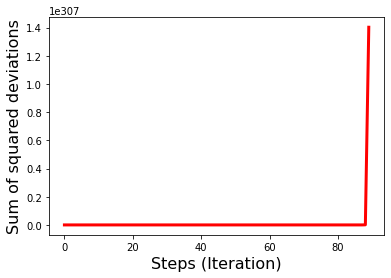

In [ ]:
import random as random
x_np = df[['T1']].values
y_np = df[['T9']].values

vector_1 = np.ones((x_np.shape[0],1))
x_np = df[['T1']].values
x_np = np.hstack((vector_1,x_np))


# Функцию определения суммы квадратов отклонений
def error_square_numpy(ab,x_np,y_np):
    y_pred = np.dot(x_np,ab)
    error = y_pred - y_np
    return sum((error)**2)

# Функцию градиентного спуска
def gradient_descent_numpy(x_np,y_np,l=0.1,tolerance=0.000000000001):
    sx = float(sum(x_np[:,1]))
    sy = float(sum(y_np))

    sxy = x_np*y_np
    sxy = float(sum(sxy[:,1]))
    sx_sq = float(sum(x_np[:,1]**2))

    num = float(x_np.shape[0])

    a = float(random.uniform(-0.5, 0.5))
    b = float(random.uniform(-0.5, 0.5))

    errors = [1,0]
    while abs(errors[-1]-errors[-2]) > tolerance:
        a_step = a - l*(num*a + b*sx - sy)/num
        b_step = b - l*(a*sx + b*sx_sq - sxy)/num
        a = a_step
        b = b_step
        ab = np.array([[a],[b]])
        errors.append(error_square_numpy(ab,x_np,y_np))

    return (ab),(errors[2:])

list_parametres_gradient_descence = gradient_descent_numpy(x_np,y_np,l=0.1,tolerance=0.000000000001)

print('\033[1m' + '\033[4m' + "Значения коэффициентов a и b:" + '\033[0m')
print('a =', list_parametres_gradient_descence[0][0][0])
print('b =', list_parametres_gradient_descence[0][1][0])
print()

print('\033[1m' + '\033[4m' + "Сумма квадратов отклонений:" + '\033[0m')
print(list_parametres_gradient_descence[1][-1][0])
print()


print('\033[1m' + '\033[4m' + "Количество итераций в градиентном спуске:" + '\033[0m')
print(len(list_parametres_gradient_descence[1]))
print()

print('График "Сумма квадратов отклонений по-шагово"')
plt.plot(range(len(list_parametres_gradient_descence[1])), list_parametres_gradient_descence[1], color='red', lw=3)
plt.xlabel('Steps (Iteration)', size=16)
plt.ylabel('Sum of squared deviations', size=16)
plt.show()

# Тут будет описание

# По материалам
1. https://github.com/bhattbhavesh91/linear-regression-assumptions
2. https://towardsdatascience.com/assumptions-of-linear-regression-fdb71ebeaa8b
3. https://habr.com/en/post/690414/
4. Еще каких-то хороших людей